## Analysis stromal

In [ ]:
# !cd /raid1/cqy/CD45-/Graduation_project

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as an
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy.sparse import csr_matrix

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/umap/distances.py:108

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.24.3 scipy==1.10.1 pandas==1.5.0 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


### 1. Reclustering and annotation

In [3]:
stroma = sc.read_h5ad("2.BatchCorrection/stroma_harmony.h5ad")
stroma

AnnData object with n_obs × n_vars = 106638 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [30]:
stroma_counts = sc.read_h5ad("2.BatchCorrection/stroma_counts.h5ad")
stroma_counts

AnnData object with n_obs × n_vars = 106638 × 16586
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'bbknn', 'harmony', 'scanorama'

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


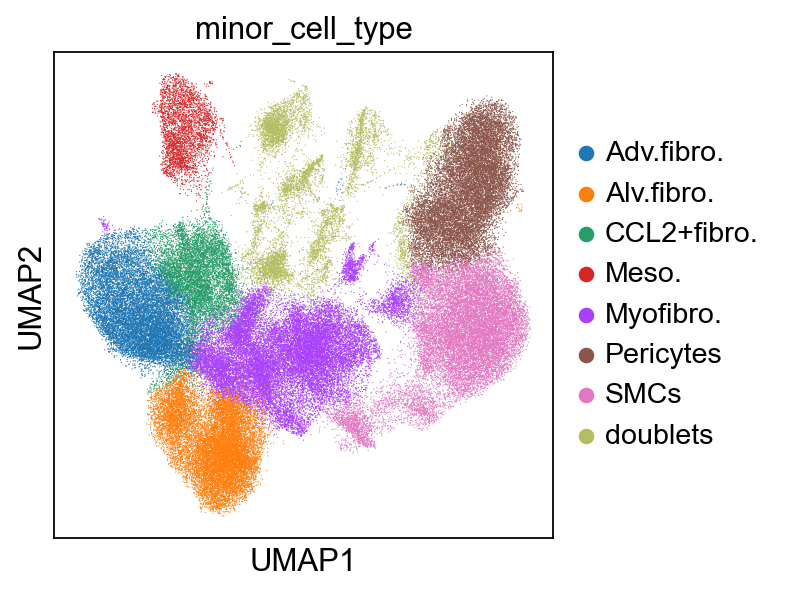

In [5]:
sc.pl.umap(stroma, color = 'minor_cell_type')

In [6]:
stroma = stroma[stroma.obs["minor_cell_type"] != "doublets"]
stroma

View of AnnData object with n_obs × n_vars = 97822 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [31]:
stroma_counts = stroma_counts[stroma_counts.obs["harmony"] != "doublets"]
stroma_counts

View of AnnData object with n_obs × n_vars = 97822 × 16586
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'bbknn', 'harmony', 'scanorama'

In [8]:
stroma = stroma.raw.to_adata()
stroma

AnnData object with n_obs × n_vars = 97822 × 16586
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

In [9]:
sc.pp.highly_variable_genes(stroma, min_mean = 0.0125, max_mean = 3, min_disp = 0.5, n_top_genes = 1000)
stroma.raw = stroma
stroma = stroma[:, stroma.var.highly_variable]
sc.pp.scale(stroma, max_value = 10)
sc.tl.pca(stroma, svd_solver = 'arpack')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


In [10]:
sc.external.pp.harmony_integrate(stroma, "dataset", max_iter_harmony = 30, plot_convergence = True)
stroma.obsm['X_pca'] = stroma.obsm['X_pca_harmony']

2024-03-18 19:22:58,292 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-03-18 19:23:17,560 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-03-18 19:23:18,051 - harmonypy - INFO - Iteration 1 of 30
2024-03-18 19:24:07,715 - harmonypy - INFO - Iteration 2 of 30
2024-03-18 19:24:56,415 - harmonypy - INFO - Iteration 3 of 30
2024-03-18 19:25:46,325 - harmonypy - INFO - Iteration 4 of 30
2024-03-18 19:26:36,196 - harmonypy - INFO - Iteration 5 of 30
2024-03-18 19:27:19,990 - harmonypy - INFO - Iteration 6 of 30
2024-03-18 19:28:04,282 - harmonypy - INFO - Iteration 7 of 30
2024-03-18 19:28:58,004 - harmonypy - INFO - Converged after 7 iterations


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:21)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:18)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


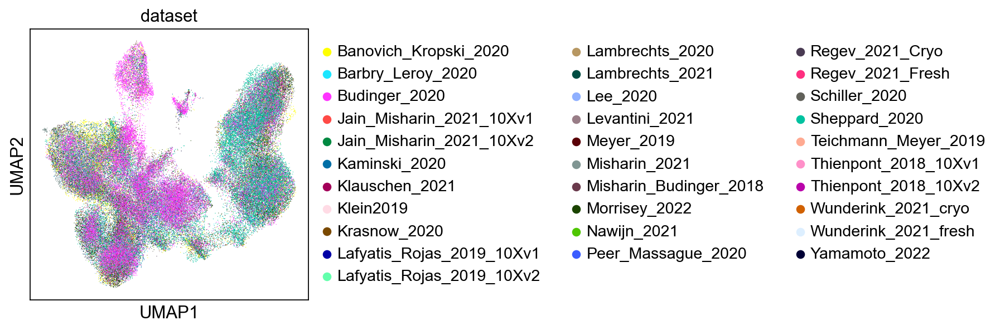

In [11]:
sc.pp.neighbors(stroma, n_neighbors=10, n_pcs = 40)
sc.tl.umap(stroma)
sc.pl.umap(stroma, color = ["dataset"])

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


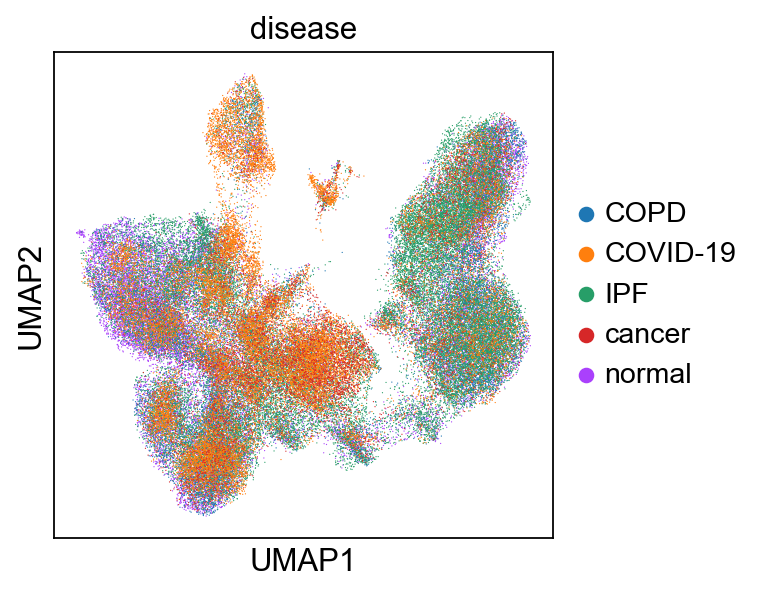

In [10]:
sc.pl.umap(stroma, color = ["disease"])

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


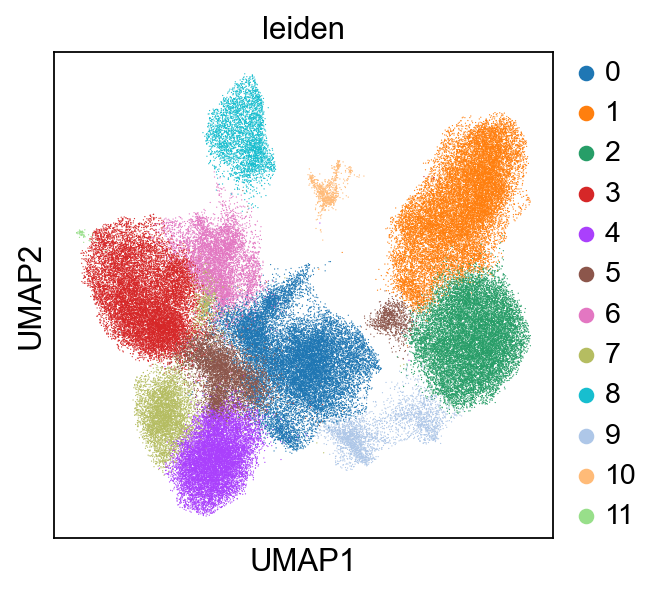

In [5]:
sc.tl.leiden(stroma, resolution = 0.6)
sc.pl.umap(stroma, color = "leiden")

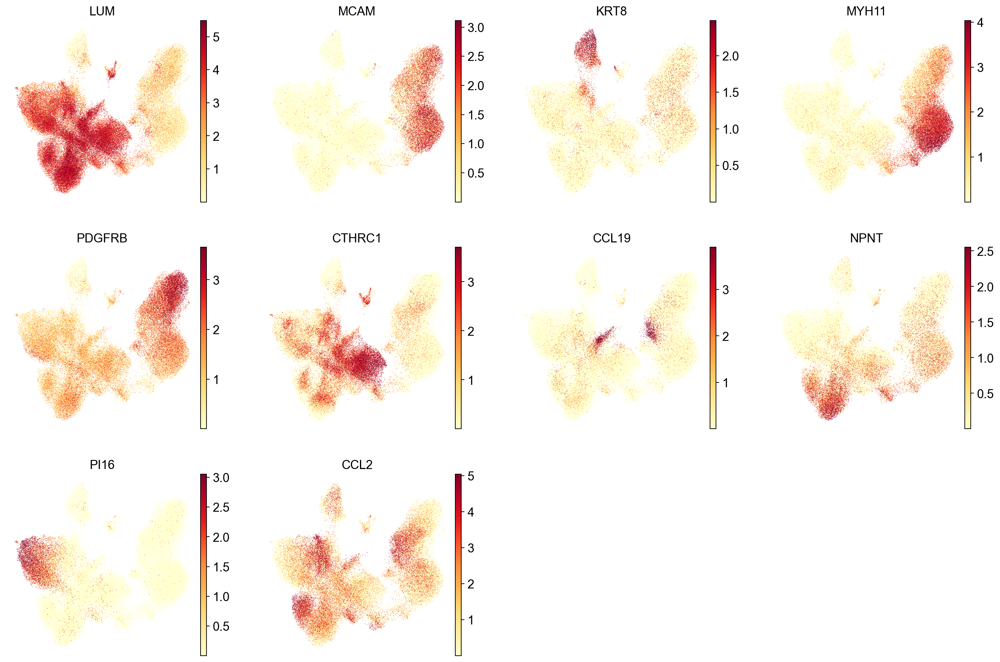

In [6]:
sc.pl.umap(stroma,
           color = ["LUM", "MCAM", "KRT8",
                    "MYH11", "PDGFRB",
                    "CTHRC1", "CCL19", "NPNT", "PI16",
                    "CCL2"],
           vmin = 0.0001,
           vmax = 'p99',
           color_map = "Blues",
           frameon = False)

running Leiden clustering
    finished: found 14 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:06)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


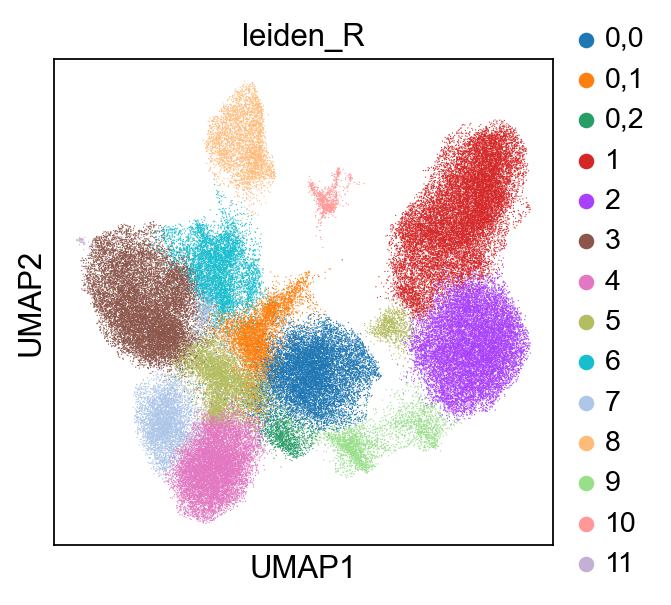

In [13]:
sc.tl.leiden(stroma, restrict_to = ("leiden", ["0"]), resolution = 0.2)
sc.pl.umap(stroma, color = "leiden_R")

running Leiden clustering
    finished: found 16 clusters and added
    'leiden_R2', the cluster labels (adata.obs, categorical) (0:00:01)


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


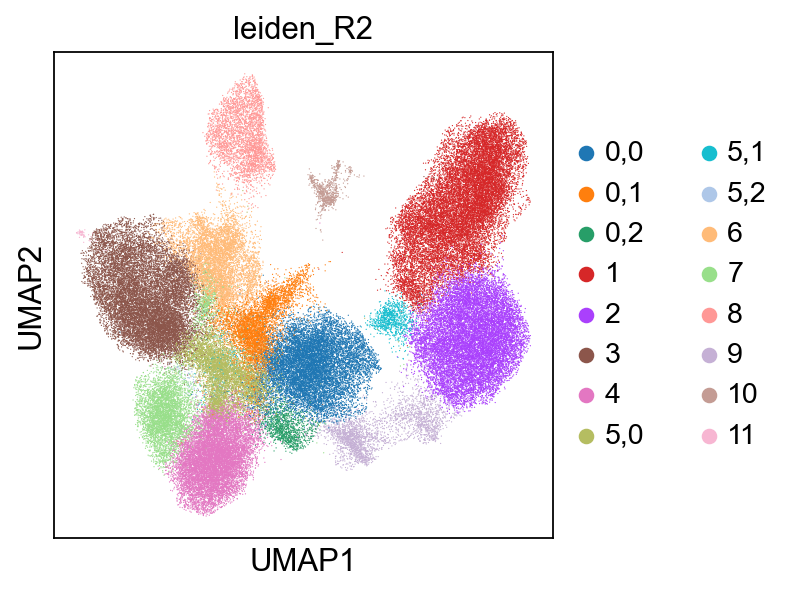

In [47]:
sc.tl.leiden(stroma, restrict_to = ("leiden_R", ["5"]), key_added = "leiden_R2", resolution = 0.25)
sc.pl.umap(stroma, color = "leiden_R2")

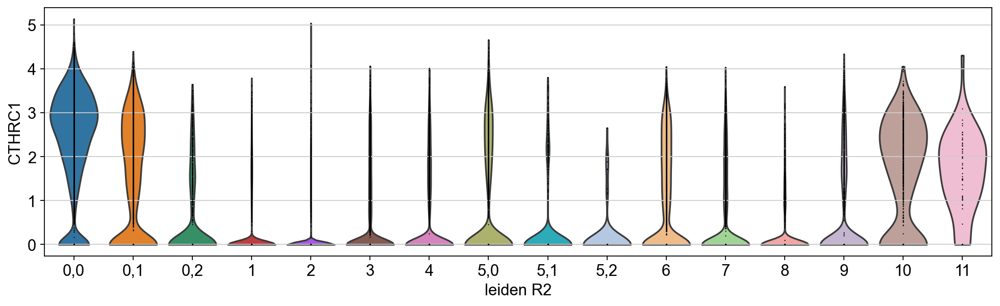

In [52]:
with plt.rc_context({'figure.figsize': (12,4)}):
    sc.pl.violin(stroma, ["CTHRC1"], groupby = "leiden_R2", jitter = False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:03:00)


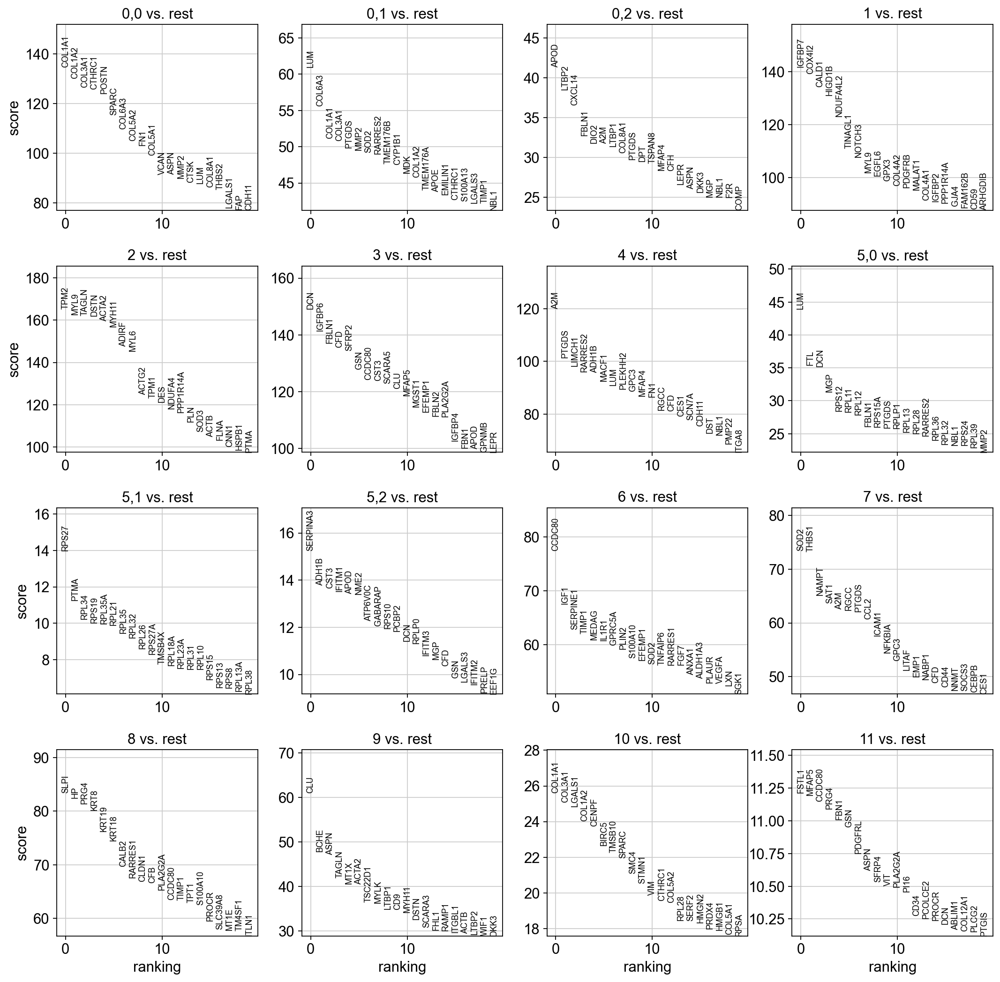

In [48]:
sc.tl.rank_genes_groups(stroma, groupby = 'leiden_R2', method = "wilcoxon")
sc.pl.rank_genes_groups(stroma, sharey = False)

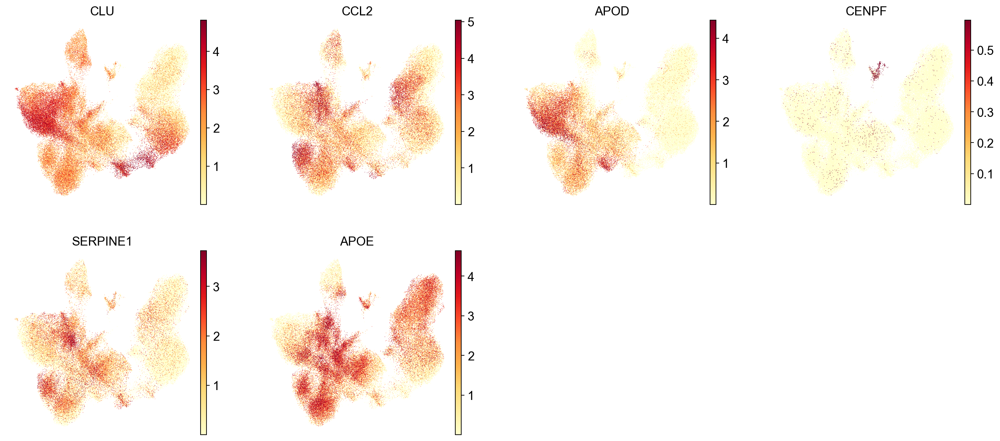

In [54]:
sc.pl.umap(stroma,
           color = ["CLU", "CCL2", "APOD", "CENPF", "SERPINE1", "APOE"],
           color_map = "YlOrRd",
           vmin = 0.0001,
           vmax = 'p99',
           frameon = False)

/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


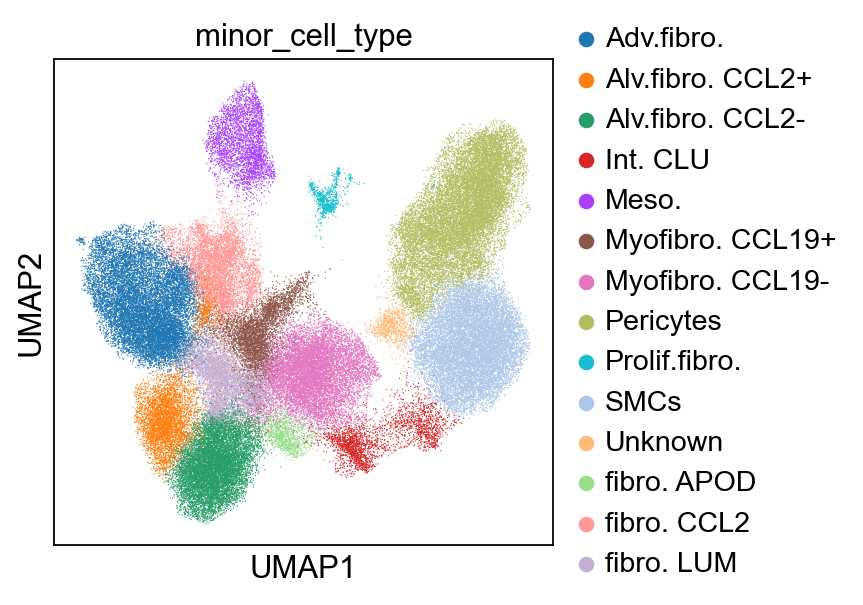

In [55]:
new_cluster_names = {
    "0,0": "Myofibro. CCL19-",
    "0,1": "Myofibro. CCL19+",
    "0,2": "fibro. APOD",
    "1": "Pericytes",
    "2": "SMCs",
    "3": "Adv.fibro.",
    "4": "Alv.fibro. CCL2-",
    "5,0": "fibro. LUM",
    "5,1": "Unknown",
    "5,2": "Alv.fibro. CCL2+",
    "6": "fibro. CCL2",
    "7": "Alv.fibro. CCL2+",
    "8": "Meso.",
    "9": "Int. CLU",
    "10": "Prolif.fibro.",
    "11": "Adv.fibro.",
}
stroma.obs["minor_cell_type"] = [new_cluster_names[i] for i in stroma.obs["leiden_R2"].tolist()]
stroma_counts.obs["minor_cell_type"] = [new_cluster_names[i] for i in stroma.obs["leiden_R2"].tolist()]
sc.pl.umap(stroma, color = ["minor_cell_type"])

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:04:00)


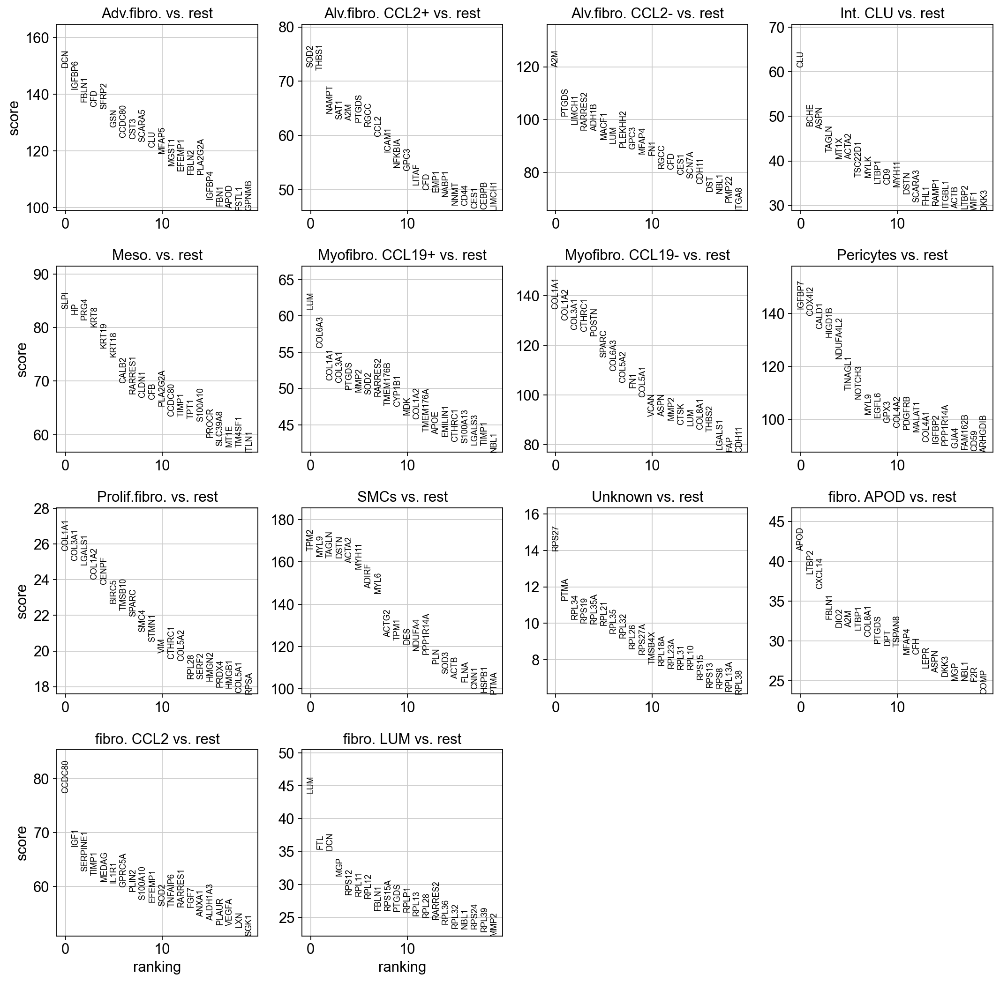

In [7]:
sc.tl.rank_genes_groups(stroma, groupby = 'minor_cell_type', method = "wilcoxon")
sc.pl.rank_genes_groups(stroma, sharey = False)

In [8]:
marker = pd.DataFrame()
result = stroma.uns['rank_genes_groups']
for group in stroma.obs['minor_cell_type'].unique():
    new_marker = pd.DataFrame(result[key][group] for key in ['names', 'pvals_adj', 'logfoldchanges', 'scores']).transpose()
    new_marker.columns = [group + '_names', group + '_pvals_adj', group + '_logfoldchanges', group + '_scores']
    marker = pd.concat([marker, new_marker], axis = 1)
marker.to_csv("3.Stroma/stroma_marker.csv", index = False)
marker

,Adv.fibro._names,Adv.fibro._pvals_adj,Adv.fibro._logfoldchanges,Adv.fibro._scores,fibro. CCL2_names,fibro. CCL2_pvals_adj,fibro. CCL2_logfoldchanges,fibro. CCL2_scores,Alv.fibro. CCL2-_names,Alv.fibro. CCL2-_pvals_adj,...,Unknown_logfoldchanges,Unknown_scores,fibro. APOD_names,fibro. APOD_pvals_adj,fibro. APOD_logfoldchanges,fibro. APOD_scores,Prolif.fibro._names,Prolif.fibro._pvals_adj,Prolif.fibro._logfoldchanges,Prolif.fibro._scores
0,DCN,0.0,2.93659,149.506485,CCDC80,0.0,2.557305,77.386871,A2M,0.0,...,0.155312,13.970151,APOD,0.0,3.885976,41.318287,COL1A1,0.0,2.700782,25.615797
1,IGFBP6,0.0,4.119921,141.663879,IGF1,0.0,2.499418,67.45858,PTGDS,0.0,...,0.231285,11.243565,LTBP2,0.0,3.042767,38.468517,COL3A1,0.0,2.697919,25.071396
2,FBLN1,0.0,3.033885,137.277939,SERPINE1,0.0,2.569912,62.811661,LIMCH1,0.0,...,-0.006656,10.224277,CXCL14,0.0,4.451212,36.577408,LGALS1,0.0,1.284686,24.83926
3,CFD,0.0,4.195269,135.698639,TIMP1,0.0,1.713998,61.996445,RARRES2,0.0,...,0.024835,10.019119,FBLN1,0.0,2.248504,32.727367,COL1A2,0.0,2.014511,24.012905
4,SFRP2,0.0,3.900721,134.794449,MEDAG,0.0,2.733225,60.847584,ADH1B,0.0,...,-0.02008,9.965275,DIO2,0.0,4.672482,31.754875,CENPF,0.0,6.931406,23.731075
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16581,PTMA,0.0,-0.946971,-78.797112,A2M,0.0,-1.584219,-42.495056,MYL9,0.0,...,-2.129253,-23.836273,RPS7,0.0,-0.582722,-15.970485,SOD3,0.0,-1.727887,-15.363722
16582,MYL9,0.0,-2.065075,-78.938637,GPX3,0.0,-1.709675,-43.45126,GAPDH,0.0,...,-2.560074,-24.695427,TPM1,0.0,-1.186588,-16.407791,TIMP3,0.0,-1.794137,-16.305878
16583,CALD1,0.0,-0.948324,-79.208878,MALAT1,0.0,-0.650798,-45.080551,TPM2,0.0,...,-2.003664,-24.967916,NEXN,0.0,-1.90973,-16.627542,SERPING1,0.0,-1.057702,-17.157494
16584,ACTA2,0.0,-3.309159,-79.406731,MYL9,0.0,-1.747111,-45.664776,TAGLN,0.0,...,-2.425859,-27.029272,EGFL6,0.0,-3.037226,-16.714468,GPX3,0.0,-2.449441,-19.896378


In [9]:
stroma.write_h5ad("3.Stroma/Stroma.h5ad")
stroma

AnnData object with n_obs × n_vars = 97822 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R', 'leiden_R2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R2_colors', 'leiden_R_colors', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [10]:
stroma_counts.write_h5ad("3.Stroma/Stroma_counts.h5ad")
stroma_counts

NameError: name 'stroma_counts' is not defined

### 2. Differential Gene Expression (DEG)

#### 2.1 Alv.fibro.

In [3]:
stroma = sc.read_h5ad("3.Stroma/Stroma.h5ad")
stroma

AnnData object with n_obs × n_vars = 97822 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R', 'leiden_R2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R2_colors', 'leiden_R_colors', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [4]:
alv = stroma[stroma.obs["minor_cell_type"].isin(["Alv.fibro. CCL2+", "Alv.fibro. CCL2-"])]
alv

View of AnnData object with n_obs × n_vars = 15842 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R', 'leiden_R2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:23)


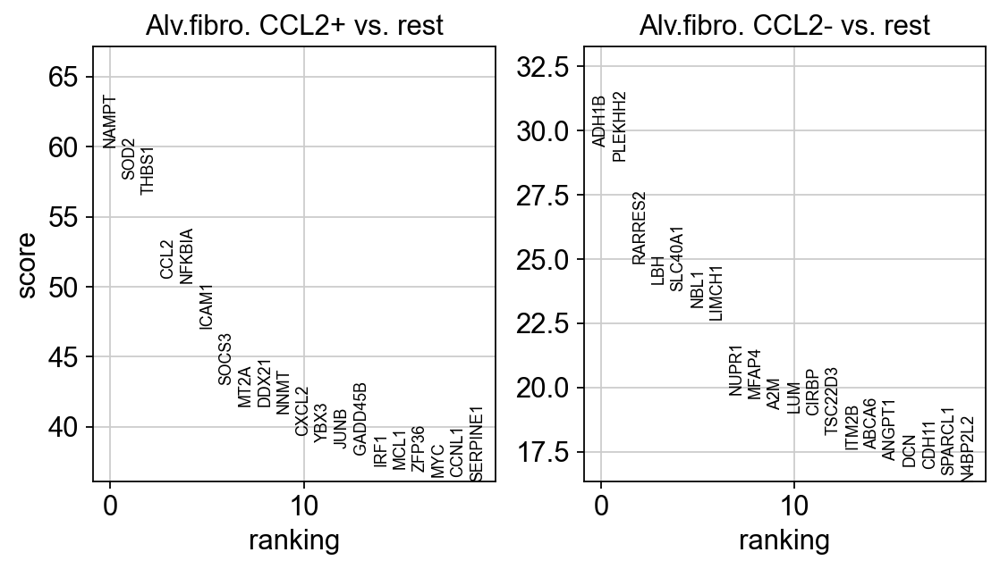

In [6]:
sc.tl.rank_genes_groups(alv, groupby = "minor_cell_type", method = "wilcoxon", use_raw = True)
sc.pl.rank_genes_groups(alv, sharey = False)

In [7]:
marker = pd.DataFrame()
result = alv.uns['rank_genes_groups']
for group in alv.obs['minor_cell_type'].unique():
    new_marker = pd.DataFrame(result[key][group] for key in ['names', 'pvals_adj', 'logfoldchanges', 'scores']).transpose()
    new_marker.columns = [group + '_names', group + '_pvals_adj', group + '_logfoldchanges', group + '_scores']
    marker = pd.concat([marker, new_marker], axis = 1)
marker.to_csv("3.Stroma/alv_marker.csv", index = False)
marker

,Alv.fibro. CCL2-_names,Alv.fibro. CCL2-_pvals_adj,Alv.fibro. CCL2-_logfoldchanges,Alv.fibro. CCL2-_scores,Alv.fibro. CCL2+_names,Alv.fibro. CCL2+_pvals_adj,Alv.fibro. CCL2+_logfoldchanges,Alv.fibro. CCL2+_scores
0,ADH1B,0.0,0.860296,29.364399,NAMPT,0.0,2.470785,59.984104
1,PLEKHH2,0.0,1.218235,28.827438,SOD2,0.0,2.349742,57.631721
2,RARRES2,0.0,0.51898,24.838787,THBS1,0.0,2.493936,56.599388
3,LBH,0.0,1.045081,24.026081,CCL2,0.0,2.977599,50.552292
4,SLC40A1,0.0,1.072667,23.764582,NFKBIA,0.0,1.980245,50.236767
...,...,...,...,...,...,...,...,...
16581,NFKBIA,0.0,-1.980245,-50.236767,SLC40A1,0.0,-1.072667,-23.764582
16582,CCL2,0.0,-2.977599,-50.552292,LBH,0.0,-1.045081,-24.026081
16583,THBS1,0.0,-2.493936,-56.599388,RARRES2,0.0,-0.51898,-24.838787
16584,SOD2,0.0,-2.349742,-57.631721,PLEKHH2,0.0,-1.218235,-28.827438


In [ ]:
# -> Decoupler.ipynb / 1. Alv.fibro.

#### 2.2 Myofibro

In [7]:
myo = stroma[stroma.obs["minor_cell_type"].isin(["Myofibro. CCL19+", "Myofibro. CCL19-"])]
myo

View of AnnData object with n_obs × n_vars = 16040 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R', 'leiden_R2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

ranking genes


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:22)


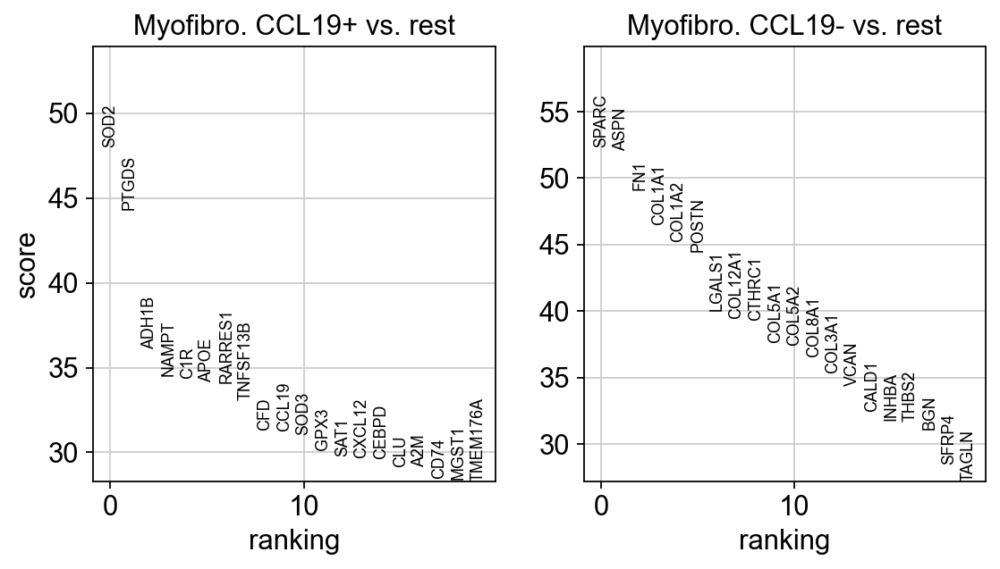

In [8]:
sc.tl.rank_genes_groups(myo, groupby = "minor_cell_type", method = "wilcoxon", use_raw = True)
sc.pl.rank_genes_groups(myo, sharey = False)

In [9]:
marker = pd.DataFrame()
result = myo.uns['rank_genes_groups']
for group in myo.obs['minor_cell_type'].unique():
    new_marker = pd.DataFrame(result[key][group] for key in ['names', 'pvals_adj', 'logfoldchanges', 'scores']).transpose()
    new_marker.columns = [group + '_names', group + '_pvals_adj', group + '_logfoldchanges', group + '_scores']
    marker = pd.concat([marker, new_marker], axis = 1)
marker.to_csv("3.Stroma/myo_marker.csv", index = False)
marker

,Myofibro. CCL19-_names,Myofibro. CCL19-_pvals_adj,Myofibro. CCL19-_logfoldchanges,Myofibro. CCL19-_scores,Myofibro. CCL19+_names,Myofibro. CCL19+_pvals_adj,Myofibro. CCL19+_logfoldchanges,Myofibro. CCL19+_scores
0,SPARC,0.0,1.322403,52.341999,SOD2,0.0,1.928446,48.01939
1,ASPN,0.0,3.049076,52.027733,PTGDS,0.0,1.914197,44.335129
2,FN1,0.0,1.506769,49.089031,ADH1B,0.0,1.860405,36.097855
3,COL1A1,0.0,1.533565,46.468319,NAMPT,0.0,1.487615,34.487865
4,COL1A2,0.0,1.191481,45.202812,C1R,0.0,0.821699,34.360035
...,...,...,...,...,...,...,...,...
16581,C1R,0.0,-0.821699,-34.360035,COL1A2,0.0,-1.191481,-45.202812
16582,NAMPT,0.0,-1.487615,-34.487865,COL1A1,0.0,-1.533565,-46.468319
16583,ADH1B,0.0,-1.860405,-36.097855,FN1,0.0,-1.506769,-49.089031
16584,PTGDS,0.0,-1.914197,-44.335129,ASPN,0.0,-3.049076,-52.027733


In [ ]:
# -> Decoupler.ipynb / 2. Myofibro.

### 3. Trajectory analysis

In [4]:
stroma = sc.read_h5ad("3.Stroma/Stroma.h5ad")
stroma

AnnData object with n_obs × n_vars = 97822 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R', 'leiden_R2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R2_colors', 'leiden_R_colors', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [5]:
set(stroma.obs["minor_cell_type"])

{'Adv.fibro.',
 'Alv.fibro. CCL2+',
 'Alv.fibro. CCL2-',
 'Int. CLU',
 'Meso.',
 'Myofibro. CCL19+',
 'Myofibro. CCL19-',
 'Pericytes',
 'Prolif.fibro.',
 'SMCs',
 'Unknown',
 'fibro. APOD',
 'fibro. CCL2',
 'fibro. LUM'}

In [6]:
fibro_subtype_list = ['Adv.fibro.',
                      'Alv.fibro. CCL2+',
                      'Alv.fibro. CCL2-',
                      'Myofibro. CCL19+',
                      'Myofibro. CCL19-',
                      'fibro. APOD',
                      'fibro. CCL2',
                      'fibro. LUM']
fibro = stroma[stroma.obs["minor_cell_type"].isin(fibro_subtype_list)]
fibro

View of AnnData object with n_obs × n_vars = 58590 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R', 'leiden_R2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [7]:
fibro = fibro.raw.to_adata()
sc.pp.highly_variable_genes(fibro, min_mean = 0.0125, max_mean = 3, min_disp = 0.5, n_top_genes = 1000)
fibro.raw = fibro
fibro = fibro[:, fibro.var.highly_variable]

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


running PAGA


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:02)
--> added 'pos', the PAGA positions (adata.uns['paga'])


<Axes: >

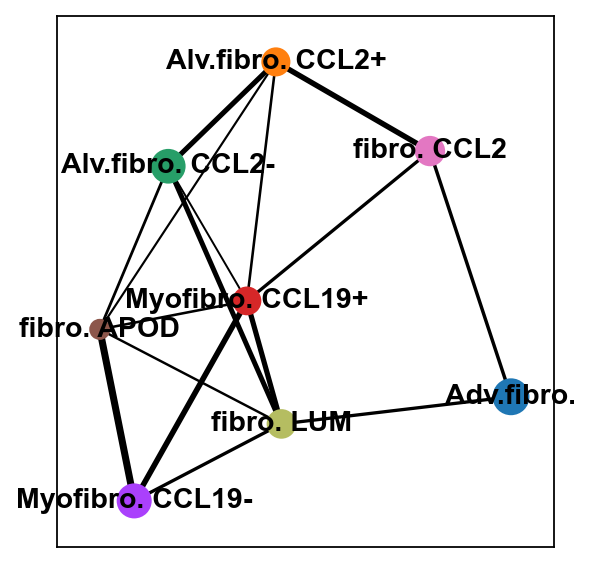

In [8]:
# Trajectory inference
sc.tl.paga(fibro, groups = "minor_cell_type")
sc.pl.paga(fibro, color = "minor_cell_type", threshold = 0.1, show=False)

In [9]:
sc.tl.diffmap(fibro)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.98488    0.98280644 0.9719606  0.960806   0.9566089
     0.94922763 0.94805986 0.9431991  0.9372968  0.9340564  0.93097746
     0.93033904 0.92781854 0.92610395]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:05)


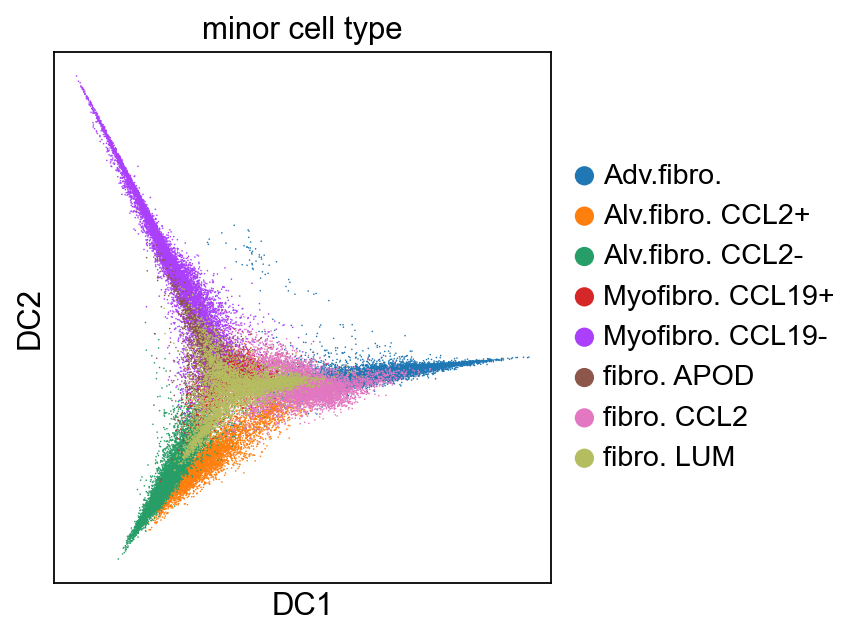

In [10]:
sc.pl.scatter(
    fibro,
    basis="diffmap",
    color=["minor_cell_type"],
    components=[1, 2],
)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:22)
running Leiden clustering
    finished: found 5 clusters and added
    'diff_cluster', the cluster labels (adata.obs, categorical) (0:00:15)


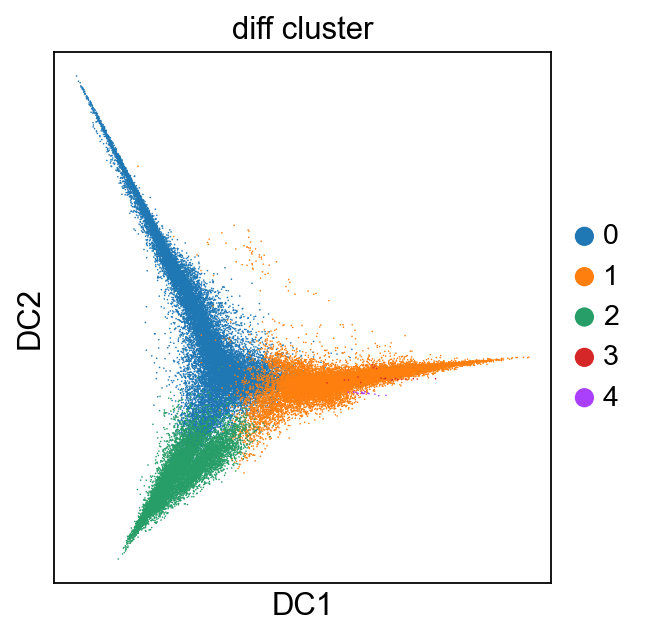

In [11]:
sc.pp.neighbors(fibro, n_neighbors = 10, use_rep = "X_diffmap")
sc.tl.leiden(fibro, key_added = "diff_cluster", resolution = 0.03)
sc.pl.scatter(
    fibro,
    basis = "diffmap",
    color = ["diff_cluster"],
    components = [1, 2],
)

computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


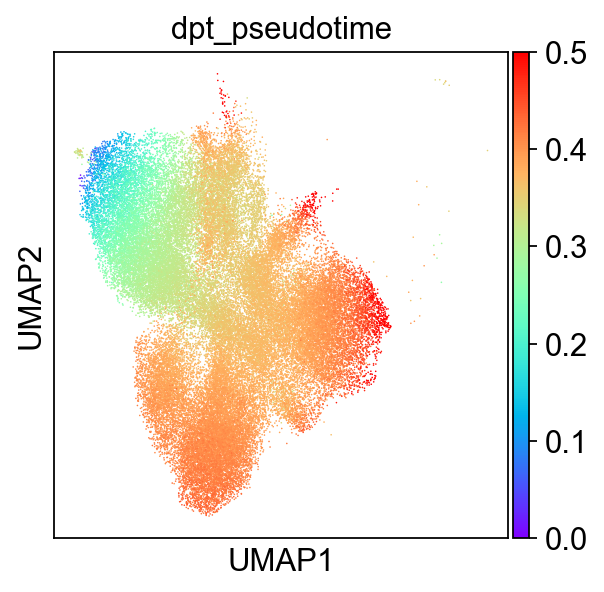

In [12]:
fibro.uns["iroot"] = fibro.obsm["X_diffmap"][:, 1].argmax()
sc.tl.dpt(fibro)
sc.pl.umap(fibro, color = "dpt_pseudotime", cmap = "rainbow", vmax = 0.5)

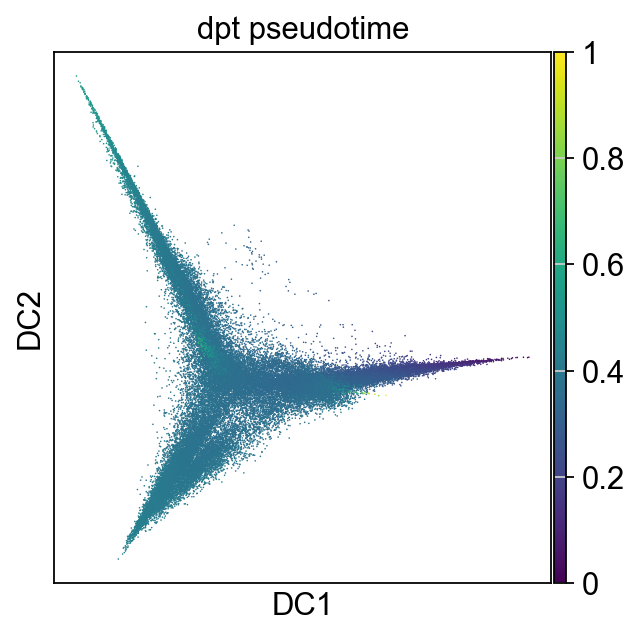

In [13]:
sc.pl.scatter(
    fibro,
    basis="diffmap",
    color=["dpt_pseudotime"],
    components=[1, 2], 
)

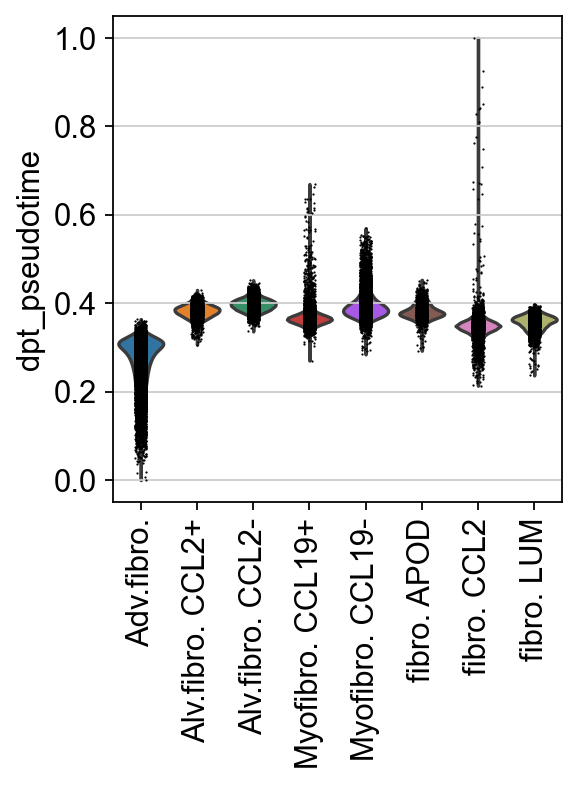

In [14]:
sc.pl.violin(fibro, "dpt_pseudotime", groupby = "minor_cell_type", rotation = 90)

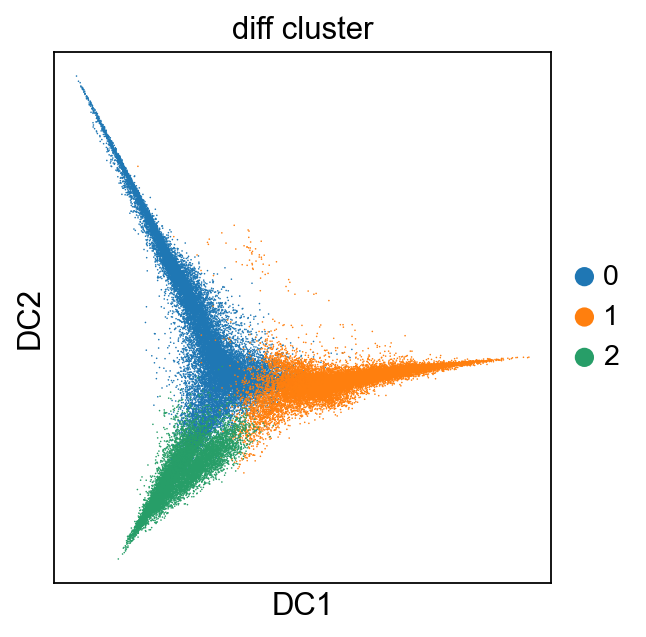

In [15]:
fibro.obs["diff_cluster"] = fibro.obs["diff_cluster"].replace(["3", "4"], "1")
sc.pl.scatter(
    fibro,
    basis = "diffmap",
    color = ["diff_cluster"],
    components = [1, 2],
)

In [18]:
fibro_diff_metadata = fibro.obs[["dpt_pseudotime", "diff_cluster", "minor_cell_type"]]
fibro_diff_metadata.to_csv("3.Stroma/fibro_diff_dpt.csv")
fibro_diff_metadata.head(5)

,dpt_pseudotime,diff_cluster,minor_cell_type
P3_4_CGGACGTTCATTCACT,0.296453,1,Adv.fibro.
P3_4_GATTCAGAGGTGATAT,0.273800,1,fibro. CCL2
ACCCACTTCAAACCGT_F02524,0.277735,1,Adv.fibro.
ACCAGTATCACCACCT-1-HCATisStab7747197,0.379103,0,Alv.fibro. CCL2-
TTTGGTTAGCGCCCAT_SC86,0.381806,2,Alv.fibro. CCL2+


In [15]:
mat = pd.DataFrame(data = fibro.X.todense(),
                   index = fibro.obs_names, columns = fibro.var_names)
mat.to_csv("3.Stroma/fibro_expr_matrix.csv")
mat.head(10)

,A2M,A2M-AS1,ABCA10,ABCA7,ABCA9,ABTB2,ACAN,ACIN1,ACKR1,ACKR3,...,ZNF251,ZNF284,ZNF318,ZNF331,ZNF366,ZNF385D,ZNF541,ZNF77,ZSWIM4,ZSWIM6
P3_4_CGGACGTTCATTCACT,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,1.464289,0.0,0.000000,...,0.0,0.0,0.0,1.464289,0.0,0.0,0.0,0.0,0.0,0.0
P3_4_GATTCAGAGGTGATAT,0.000000,0.0,0.000000,0.0,0.983546,0.0,0.0,0.000000,0.0,0.983546,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
ACCCACTTCAAACCGT_F02524,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
ACCAGTATCACCACCT-1-HCATisStab7747197,2.876804,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
TTTGGTTAGCGCCCAT_SC86,4.515569,0.0,0.000000,0.0,1.256166,0.0,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,1.256166,0.0,0.0,0.0,0.0,0.0,0.0
TACACCCTCAGCTTCC_SC86,4.807429,0.0,0.753408,0.0,0.000000,0.0,0.0,0.753408,0.0,0.000000,...,0.0,0.0,0.0,0.753408,0.0,0.0,0.0,0.0,0.0,0.0
P2_1_GTACGTAGTATTAGCC,4.210536,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
P3_6_TTGCCGTGTCCGTTAA,4.258434,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
CAGCATAGTTGTGGCC-1-HCATisStab7659969,2.736863,0.0,0.372393,0.0,0.643119,0.0,0.0,0.372393,0.0,0.000000,...,0.0,0.0,0.0,0.643119,0.0,0.0,0.0,0.0,0.0,0.0
CGGACACGTAATTGGA_F02607,5.204391,0.0,2.222508,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
fibro.write_h5ad("3.Stroma/fibro_diff.h5ad")
fibro

AnnData object with n_obs × n_vars = 58590 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R', 'leiden_R2', 'diff_cluster', 'dpt_pseudotime'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'paga', 'minor_cell_type_sizes', 'minor_cell_type_colors', 'diffmap_evals', 'diff_cluster_colors', 'iroot'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'X_diffmap'
    obsp: 'connectivities', 'distances'

In [ ]:
# -> Trajectory_analysis.rmd
# -> Decoupler.ipynb / 3. Fibroblast Trajectory Analysis

### 4. Disease

In [3]:
stroma = sc.read_h5ad("3.Stroma/Stroma.h5ad")
stroma

AnnData object with n_obs × n_vars = 97822 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R', 'leiden_R2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R2_colors', 'leiden_R_colors', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

#### 4.1 R o/e

In [4]:
df = stroma.obs[["cellID", "minor_cell_type", "disease"]]
grouped = df.groupby(["disease", "minor_cell_type"]).size().reset_index(name = "counts")
grouped = grouped.pivot(index='minor_cell_type', columns="disease", values="counts").fillna(0)
grouped.to_csv("3.Stroma/stroma_disease.csv")
grouped

disease,COPD,COVID-19,IPF,cancer,normal
minor_cell_type,,,,,
Adv.fibro.,1237,2038,3347,358,7012
Alv.fibro. CCL2+,758,1074,1540,238,1417
Alv.fibro. CCL2-,1610,2886,3014,675,2630
Int. CLU,384,245,1245,180,699
Meso.,337,2093,487,129,393
Myofibro. CCL19+,398,1858,1369,559,648
Myofibro. CCL19-,475,4806,3247,1788,892
Pericytes,1834,1746,8873,966,3707
Prolif.fibro.,25,448,127,86,61


In [9]:
expected = np.outer(grouped.sum(axis = 1), grouped.sum(axis = 0)) / grouped.sum().sum()
expected = pd.DataFrame(expected, index = grouped.index.tolist(), columns = grouped.columns.tolist())
expected

,COPD,COVID-19,IPF,cancer,normal
Adv.fibro.,1572.387152,3243.182597,4944.015457,937.167345,3295.247449
Alv.fibro. CCL2+,564.922114,1165.200037,1776.269704,336.702419,1183.905727
Alv.fibro. CCL2-,1215.363569,2506.791008,3821.435618,724.375703,2547.034103
Int. CLU,309.375488,638.113328,972.761189,184.392632,648.357363
Meso.,386.466511,797.120137,1215.156458,230.340087,809.916808
Myofibro. CCL19+,543.008485,1120.001308,1707.367259,323.641553,1137.981395
Myofibro. CCL19-,1259.527959,2597.883830,3960.300546,750.698371,2639.589295
Pericytes,1924.578500,3969.607287,6051.401423,1147.078898,4033.333892
Prolif.fibro.,83.946055,173.145898,263.949367,50.033162,175.925518
SMCs,1576.095612,3250.831613,4955.675870,939.377645,3303.019259


In [12]:
ROE = grouped/expected
ROE.to_csv("3.Stroma/stroma_ROE.csv")
ROE

disease,COPD,COVID-19,IPF,cancer,normal
minor_cell_type,,,,,
Adv.fibro.,0.786702,0.628395,0.676980,0.382002,2.127913
Alv.fibro. CCL2+,1.341778,0.921730,0.866985,0.706856,1.196886
Alv.fibro. CCL2-,1.324706,1.151273,0.788709,0.931837,1.032574
Int. CLU,1.241210,0.383944,1.279862,0.976178,1.078109
Meso.,0.872003,2.625702,0.400771,0.560041,0.485235
Myofibro. CCL19+,0.732954,1.658927,0.801819,1.727219,0.569429
Myofibro. CCL19-,0.377125,1.849967,0.819887,2.381782,0.337931
Pericytes,0.952936,0.439842,1.466272,0.842139,0.919091
Prolif.fibro.,0.297810,2.587413,0.481153,1.718860,0.346738


#### 4.2 Frequency

In [45]:
cellcounts = pd.DataFrame(columns = pd.unique(stroma.obs["minor_cell_type"]))
cellcounts

,Adv.fibro.,fibro. CCL2,Alv.fibro. CCL2-,Alv.fibro. CCL2+,Pericytes,Int. CLU,SMCs,Myofibro. CCL19-,Myofibro. CCL19+,fibro. LUM,Meso.,Unknown,fibro. APOD,Prolif.fibro.


In [46]:
disease_list = ["normal", "COPD", "IPF", "COVID-19", "cancer"]
for disease in disease_list:
    stroma_sub = stroma[stroma.obs["disease"] == disease]
    df = stroma_sub.obs[["sampleID", "minor_cell_type"]]
    df = df.groupby("sampleID").value_counts()
    df = df.reset_index(name = "count").pivot(index = "sampleID", columns = "minor_cell_type", values = "count")
    df["disease"] = disease
    cellcounts = pd.concat([cellcounts, df])
cellcounts

,Adv.fibro.,fibro. CCL2,Alv.fibro. CCL2-,Alv.fibro. CCL2+,Pericytes,Int. CLU,SMCs,Myofibro. CCL19-,Myofibro. CCL19+,fibro. LUM,Meso.,Unknown,fibro. APOD,Prolif.fibro.,disease
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D322,4,0,1,0,14,0,28,1,2,10,0,2,3,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D326,3,0,6,0,14,12,21,5,2,0,0,0,2,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D339,8,0,2,0,0,1,14,2,0,1,0,0,0,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D344,7,0,4,0,16,15,50,7,1,11,0,0,1,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D353,4,0,4,0,2,11,34,6,3,6,0,1,3,0,normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
p030t,2,1,0,0,12,2,8,31,3,0,0,2,1,1,cancer
p031t,11,26,1,3,19,0,36,18,6,6,21,1,2,0,cancer
p032t,0,0,27,2,15,12,3,1,0,1,0,0,0,0,cancer
p033t,0,4,0,0,5,0,7,17,4,0,1,0,0,0,cancer


In [47]:
cellcounts.to_csv("3.Stroma/stroma_minor_cell_type.csv")
cellcounts

,Adv.fibro.,fibro. CCL2,Alv.fibro. CCL2-,Alv.fibro. CCL2+,Pericytes,Int. CLU,SMCs,Myofibro. CCL19-,Myofibro. CCL19+,fibro. LUM,Meso.,Unknown,fibro. APOD,Prolif.fibro.,disease
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D322,4,0,1,0,14,0,28,1,2,10,0,2,3,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D326,3,0,6,0,14,12,21,5,2,0,0,0,2,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D339,8,0,2,0,0,1,14,2,0,1,0,0,0,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D344,7,0,4,0,16,15,50,7,1,11,0,0,1,0,normal
homosapiens_None_2023_None_sikkemalisa_002_d10_1101_2022_03_10_483747D353,4,0,4,0,2,11,34,6,3,6,0,1,3,0,normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
p030t,2,1,0,0,12,2,8,31,3,0,0,2,1,1,cancer
p031t,11,26,1,3,19,0,36,18,6,6,21,1,2,0,cancer
p032t,0,0,27,2,15,12,3,1,0,1,0,0,0,0,cancer
p033t,0,4,0,0,5,0,7,17,4,0,1,0,0,0,cancer


In [172]:
stroma = sc.read_h5ad("3.Stroma/Stroma.h5ad")
stroma

AnnData object with n_obs × n_vars = 97822 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R', 'leiden_R2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R2_colors', 'leiden_R_colors', 'leiden_colors', 'minor_cell_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [173]:
myofibro_mural = stroma[stroma.obs["minor_cell_type"].isin(["Myofibro. CCL19+", "Myofibro. CCL19-", "Pericytes", "SMCs"])]
myofibro_mural.obs["minor_cell_type"].replace("Myofibro. CCL19+", "Myofibro.")
myofibro_mural.obs["minor_cell_type"].replace("Myofibro. CCL19-", "Myofibro.")
myofibro_mural.obs["minor_cell_type"].replace("Pericytes", "Mural")
myofibro_mural.obs["minor_cell_type"].replace("SMCs", "Mural")
myofibro_mural

View of AnnData object with n_obs × n_vars = 47191 × 1000
    obs: 'method', 'sampleID', 'disease', 'dataset', 'sex', 'age', 'smoking_status', 'major_cell_type', 'cellID', 'histology', 'leiden', 'minor_cell_type', 'batch_variety', 'leiden_R', 'leiden_R2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dataset_colors', 'disease_colors', 'hvg', 'leiden', 'leiden_R2_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

ranking genes


/home/cqy/anaconda3/envs/NSCLC/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:01)


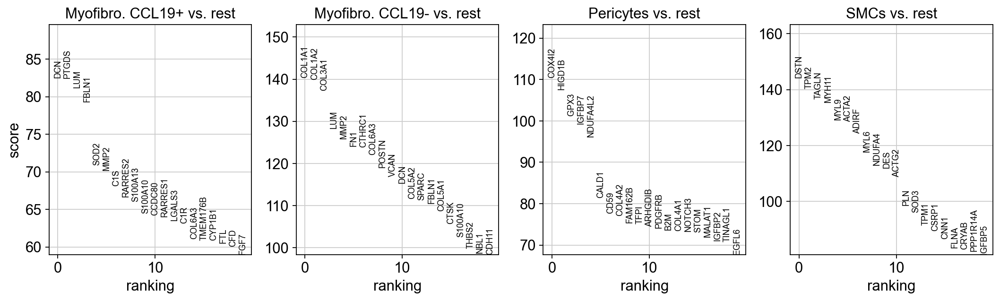

In [174]:
sc.tl.rank_genes_groups(myofibro_mural, groupby = "minor_cell_type", method = "wilcoxon", use_raw = True)
sc.pl.rank_genes_groups(myofibro_mural, sharey = False)

In [175]:
marker = pd.DataFrame()
result = myofibro_mural.uns['rank_genes_groups']
for group in myofibro_mural.obs['minor_cell_type'].unique():
    new_marker = pd.DataFrame(result[key][group] for key in ['names', 'pvals_adj', 'logfoldchanges', 'scores']).transpose()
    new_marker.columns = [group + '_names', group + '_pvals_adj', group + '_logfoldchanges', group + '_scores']
    marker = pd.concat([marker, new_marker], axis = 1)
marker.to_csv("3.Stroma/myofibro_mural_marker.csv", index = False)
marker

,Pericytes_names,Pericytes_pvals_adj,Pericytes_logfoldchanges,Pericytes_scores,SMCs_names,SMCs_pvals_adj,SMCs_logfoldchanges,SMCs_scores,Myofibro. CCL19-_names,Myofibro. CCL19-_pvals_adj,Myofibro. CCL19-_logfoldchanges,Myofibro. CCL19-_scores,Myofibro. CCL19+_names,Myofibro. CCL19+_pvals_adj,Myofibro. CCL19+_logfoldchanges,Myofibro. CCL19+_scores
0,COX4I2,0.0,3.621932,110.43705,DSTN,0.0,2.636798,144.275803,COL1A1,0.0,5.290663,140.351624,DCN,0.0,2.875436,82.521751
1,HIGD1B,0.0,4.234001,107.483543,TPM2,0.0,2.573509,140.341293,COL1A2,0.0,4.297521,139.874435,PTGDS,0.0,4.077842,82.420151
2,GPX3,0.0,2.427969,101.276917,TAGLN,0.0,3.412008,136.631973,COL3A1,0.0,5.023333,137.265366,LUM,0.0,3.9661,81.189812
3,IGFBP7,0.0,1.781776,99.209114,MYH11,0.0,4.449938,135.4133,LUM,0.0,4.678768,128.325974,FBLN1,0.0,3.233038,79.271034
4,NDUFA4L2,0.0,3.156219,96.09687,MYL9,0.0,2.621077,129.235199,MMP2,0.0,4.160131,125.818748,SOD2,0.0,2.927335,70.842445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16581,RPLP1,0.0,-1.012861,-87.720505,TMSB10,0.0,-1.608801,-98.984375,GPX3,0.0,-3.300757,-94.889465,TPM2,0.0,-1.702301,-60.471619
16582,COL1A1,0.0,-3.435624,-91.50354,DCN,0.0,-2.829597,-103.408958,PPP1R14A,0.0,-3.86429,-96.736168,ACTA2,0.0,-3.109731,-61.207985
16583,S100A6,0.0,-1.929048,-93.291458,COL6A3,0.0,-4.571726,-104.271683,ADIRF,0.0,-4.302326,-100.208206,TAGLN,0.0,-3.000106,-64.75206
16584,MFAP4,0.0,-2.962862,-102.67308,SPARC,0.0,-2.310166,-104.566345,MYL9,0.0,-2.395006,-101.11174,CALD1,0.0,-1.277666,-66.850937
